In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
import itertools
import numpy as np
import matplotlib.pyplot as plt

from osgeo import gdal
from matplotlib import patches as mpl_patches
from matplotlib.colors import Colormap

In [33]:
%matplotlib inline

In [34]:
import glob 
import datetime

In [64]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [130]:
import cv2

In [131]:
import copy

# Check IO swath

In [2]:
datadir = '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA'

In [10]:
open_tif = gdal.Open(datadir+'/2017-01-01_MOD09GA_open-cell.tif')

In [11]:
closed_tif = gdal.Open(datadir+'/2017-01-01_MOD09GA_closed-cell.tif')

In [5]:
# check size
def _io_size(swath_tif):
    print(swath_tif.RasterXSize, swath_tif.RasterYSize)

In [12]:
for i in [open_tif, closed_tif]:
    _io_size(swath_tif=i)

1600 1175
1146 1140


In [13]:
# Convert Raster to Array
"""In case you want to convert and existing Gdal Dataset or a Band into a numpy array 
   you can convert it with ReadAsArray() -function:
"""
open_swath = open_tif.ReadAsArray()
closed_swath = closed_tif.ReadAsArray()

In [14]:
# Check array shape
open_swath.shape

(7, 1175, 1600)

In [20]:
def _rolling(swath):
    """ Roll array [band, lat, lon] to _array[lat, lon, band]"""
    return np.rollaxis(swath, 0, 3)

In [18]:
open_swath = _rolling(swath=open_swath)
closed_swath = _rolling(swath=closed_swath)

In [19]:
open_swath.shape

(1175, 1600, 7)

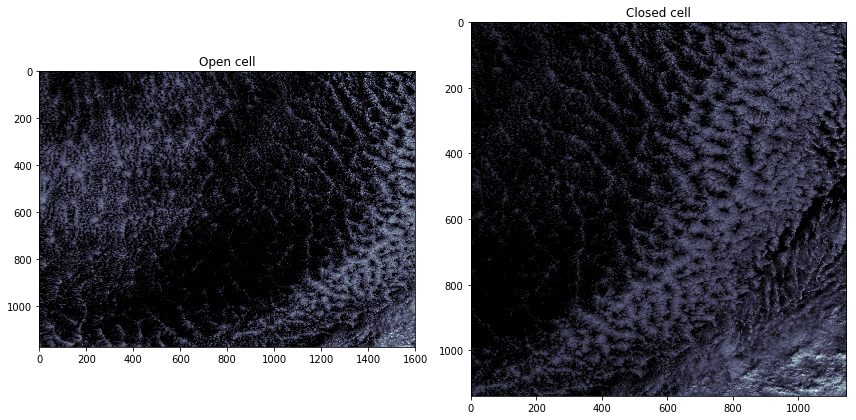

In [30]:
plt.figure(figsize=(12,12))
#
ax = plt.subplot(121)
plt.imshow(open_swath[:,:,0], cmap='bone')
ax.set_title('Open cell')
#
ax = plt.subplot(122)
plt.imshow(closed_swath[:,:,0], cmap='bone')
ax.set_title('Closed cell')
plt.tight_layout()
plt.show()

## Check other date

### Functionaize

In [58]:
def _plot_swath(open_swath, closed_swath, month='Jan', date='1'):
    plt.figure(figsize=(12,12))
    #
    ax = plt.subplot(121)
    plt.imshow(open_swath[:,:,0], cmap='bone')
    ax.set_title('Open cell %s' %(month+"-"+date))
    #
    ax = plt.subplot(122)
    plt.imshow(closed_swath[:,:,0], cmap='bone')
    ax.set_title('Closed cell %s' %(month+"-"+date))
    plt.tight_layout()
    plt.show()

In [52]:
def _gen_filelist(datadir='./', keyward='MOD09GA_XXX-cell', extension='.tif'):
    def getdates(date, datadir='./', keyward='MOD09GA_XXX-cell', extension='.tif'):
        # Do not forget add directory name
        tmp_date = datetime.datetime.strptime(date, datadir+'/'+'%Y-%m-%d_'+keyward+extension)
        return datetime.datetime(tmp_date.year, tmp_date.month, tmp_date.day)
    _filelist = []
    _filelist = glob.glob(datadir+"/*"+keyward+"*"+extension)
    filelist = sorted(_filelist, key=lambda x: getdates(x, datadir=datadir, keyward=keyward))
    try:
        if len(filelist) > 0:
            print(" NORMAL END: Filelist")
    except:
        raise NameError('Invalid argument')
    return filelist

In [50]:
open_filelist = _gen_filelist(datadir=datadir, keyward='MOD09GA_open-cell')

 NORMAL END: Filelist


In [53]:
closed_filelist = _gen_filelist(datadir=datadir, keyward='MOD09GA_closed-cell')

 NORMAL END: Filelist


In [51]:
open_filelist

['/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-01_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-02_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-03_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-04_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-05_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-06_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-07_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-08_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-09_MOD09GA_open-cell.tif',
 '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-10_MOD0

In [56]:
def _gen_swath(filelist ):
    swath_list = []
    for ifile in filelist:
        swath_tif = gdal.Open(ifile)
        swath = swath_tif.ReadAsArray()
        swath_array = _rolling(swath=swath)
        swath_list += [swath_array]
    return swath_list

In [57]:
open_swath_list = _gen_swath(open_filelist)
closed_swath_list = _gen_swath(closed_filelist)

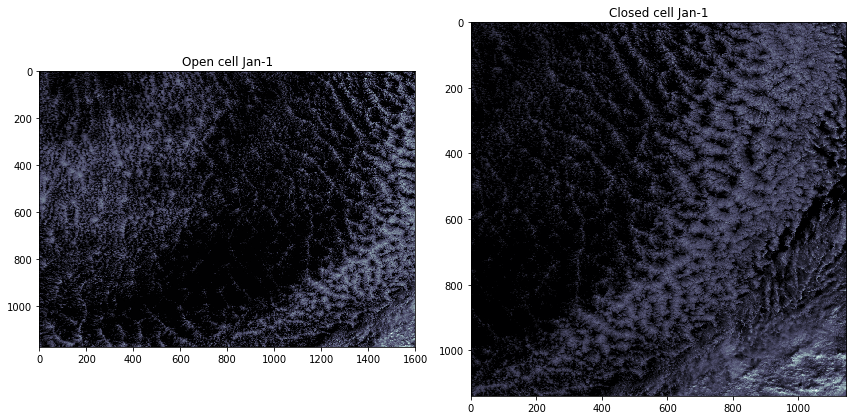

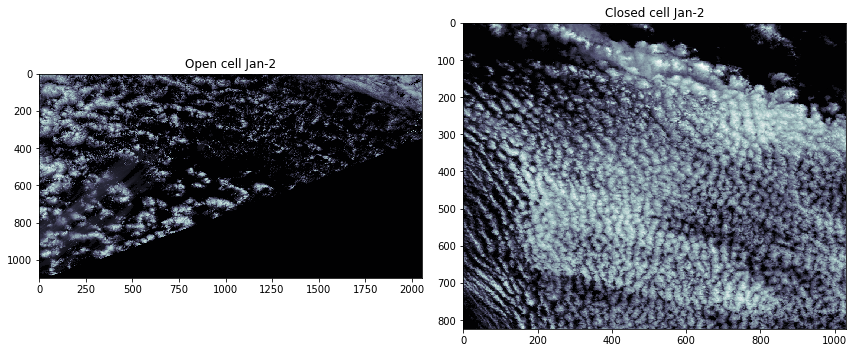

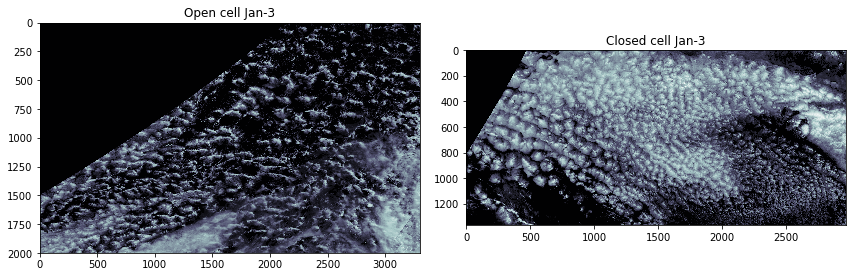

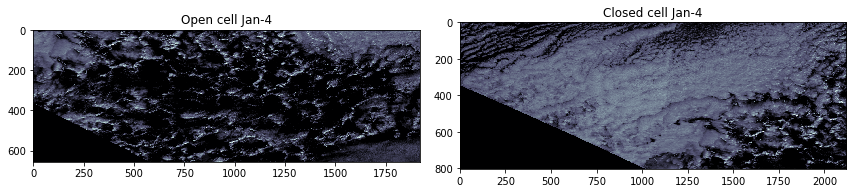

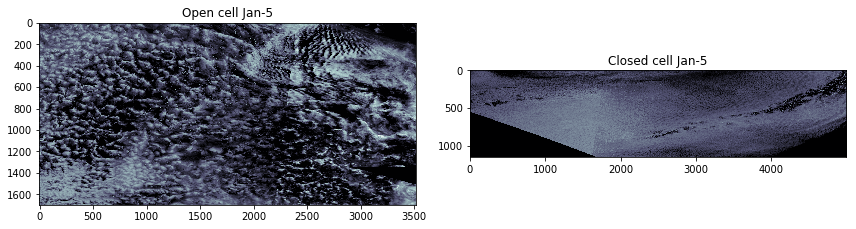

...

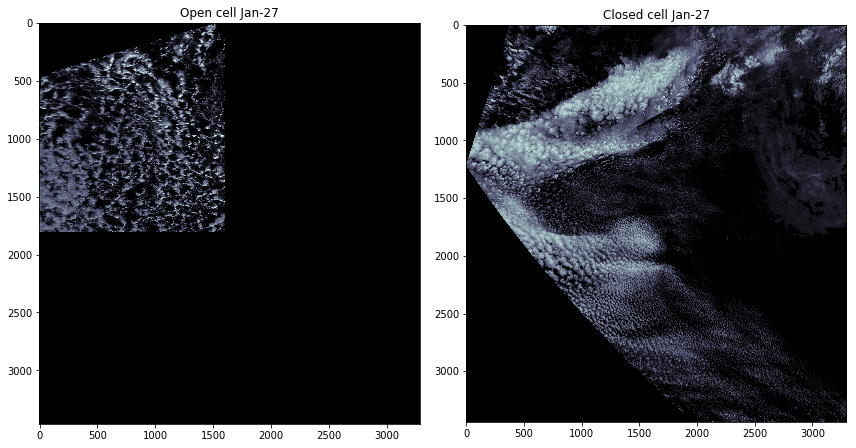

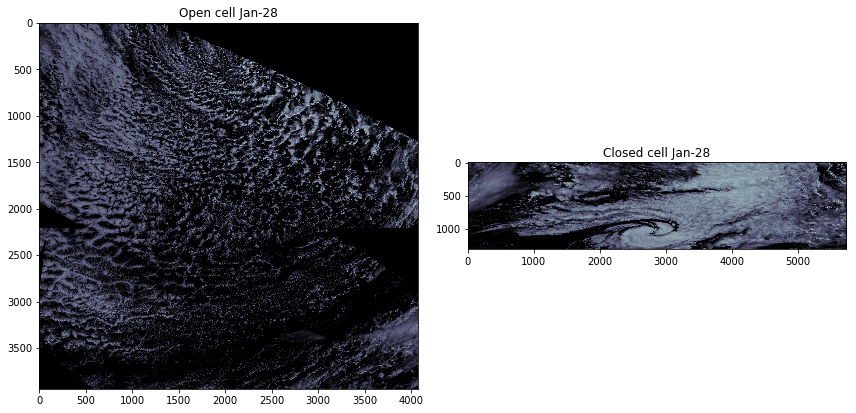

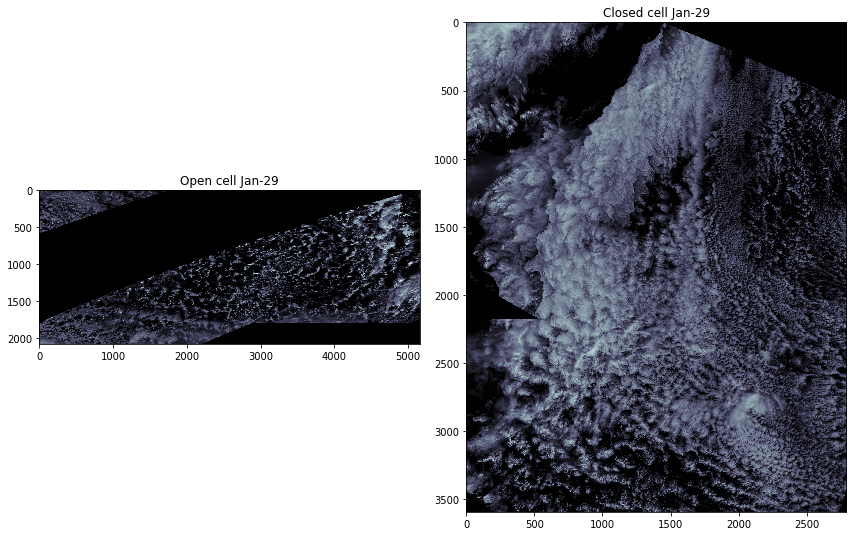

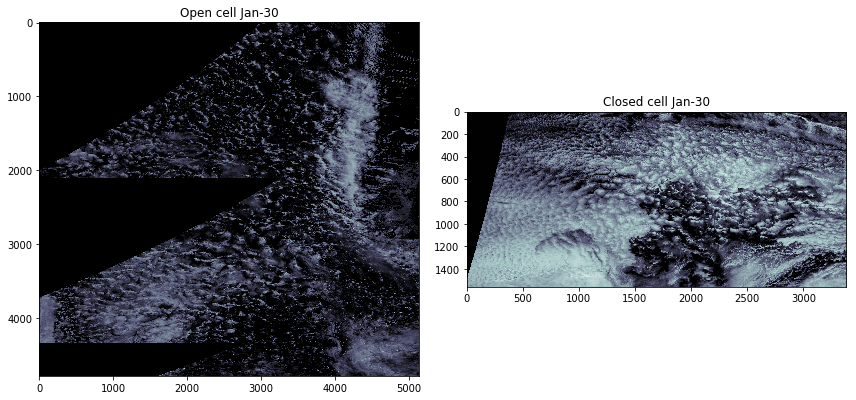

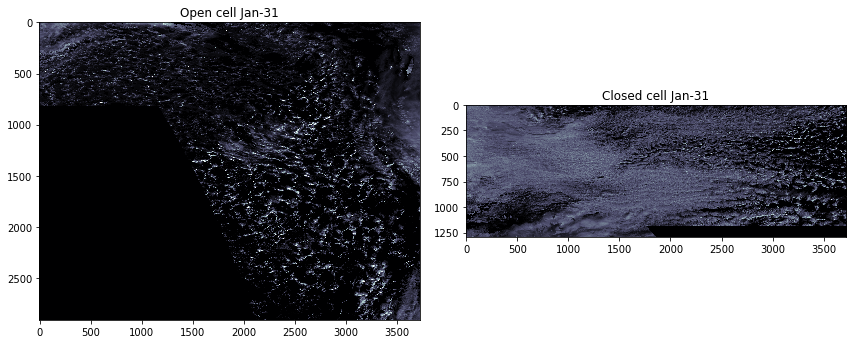

In [59]:
icount = 1
for iopen, iclosed in zip(open_swath_list, closed_swath_list):
    _plot_swath(open_swath=iopen, closed_swath=iclosed, date=str(icount))
    icount += 1

## Check value in black blob

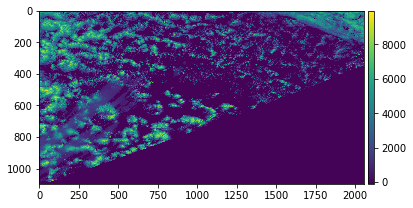

In [68]:
swath_jan2 = open_swath_list[1]
fig = plt.figure()
ax = plt.subplot(111)
im  = plt.imshow(swath_jan2[:,:,0])
divider = make_axes_locatable(ax)
ax_cb = divider.new_horizontal(size="2%", pad=0.05)
fig.add_axes(ax_cb)
fig.colorbar(im, cax=ax_cb)
plt.show()

### generate patches for Jan-02 data

In [69]:
def _gen_patches(swath, istride=128,ipatch_size=128 ):
    swath_mean = swath.mean(axis=(0,1))
    swath_std = swath.std(axis=(0,1))
    patches = []

    stride =  istride   #128
    patch_size = ipatch_size #128

    patches = []
    for i in range(0, swath.shape[0], stride):
        row = []
        for j in range(0, swath.shape[1], stride):
            if i + patch_size <= swath.shape[0] and j + patch_size <= swath.shape[1]:
                p = swath[i:i + patch_size, j:j + patch_size].astype(float)
                p -= swath_mean
                p /= swath_std
            
                row.append(p)
        if row:
            patches.append(row)
            
    return np.stack(patches)

In [70]:
patches = _gen_patches(swath=swath_jan2)

In [71]:
patches.shape

(8, 16, 128, 128, 7)

In [90]:
def _plot_with_bounding_patch(swath, patches, patch_size=128, label='Jan-02', line_width=1):
    row = patches.shape[0]
    col = patches.shape[1]
    fig , ax = plt.subplots(figsize=(14,14))
    # swath
    im = plt.imshow(swath[:,:,0], cmap='bone')
    
    # bounding box  
    for (idx, i) ,(jdx, j) in itertools.product(enumerate (range(row)), 
                                                enumerate(range(col))):
        ax.add_patch(mpl_patches.Rectangle(
            (j*patch_size+line_width, i*patch_size+line_width),
            width  = patch_size - 2* line_width,
            height = patch_size - 2 * line_width,
            linewidth = 4,
            edgecolor = "#d62728",
            facecolor = "none"
            )
        )
        icount = str(idx)+'-'+str(jdx)
        centerx = 0.5*patch_size*(2*j+0.5)
        centery = 0.5*patch_size*(2*i+1)
        plt.text(centerx, centery, icount, 
                 fontsize=12, 
                 weight='bold',
                 color="#d62728"
                )
    plt.title(" %s " %label)
    # color bar
    divider = make_axes_locatable(ax)
    ax_cb = divider.new_horizontal(size="2%", pad=0.05)
    fig.add_axes(ax_cb)
    fig.colorbar(im, cax=ax_cb)
    
    fig.tight_layout()
    plt.show()

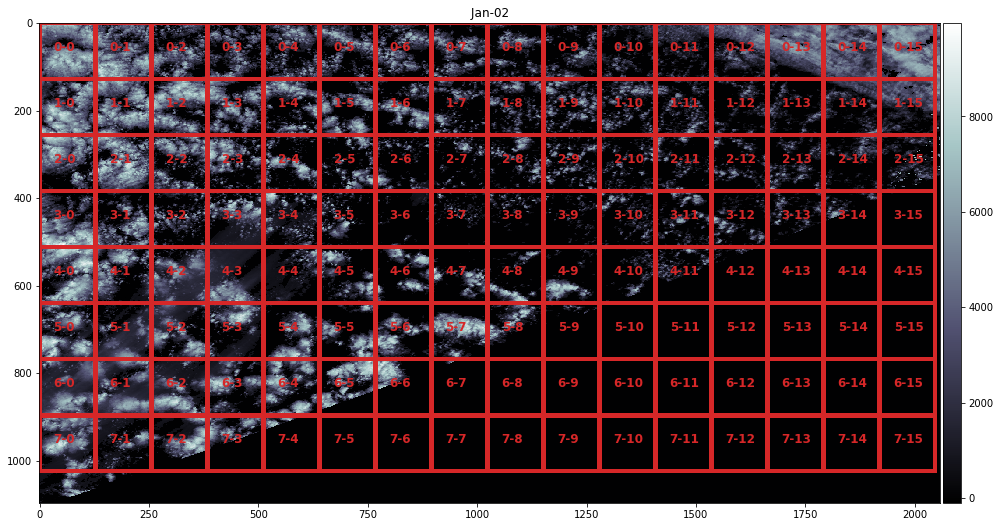

In [91]:
_plot_with_bounding_patch(swath_jan2, patches=patches)

In [115]:
_patch_1d = patches[7,13,:,:,0].flatten()
print(patches[0,0,:,:,0].shape)
_patch_1d.shape

(128, 128)


(16384,)

In [116]:
_patch_1d

array([-0.61749354, -0.61749354, -0.61749354, ..., -0.61749354,
       -0.61749354, -0.61749354])

In [117]:
np.argwhere(_patch_1d <= 0.00)

array([[    0],
       [    1],
       [    2],
       ...,
       [16381],
       [16382],
       [16383]])

In [123]:
def _color_plot_with_bounding_patch(swath, patches, patch_size=128, label='Jan-02', 
                                    line_width=1, alpha=0.5):
    row = patches.shape[0]
    col = patches.shape[1]
    fig , ax = plt.subplots(figsize=(14,14))
    # swath
    im = plt.imshow(swath[:,:,0], cmap='bone')
    
    def _judge_color(patch, black_blob=128*128, thres_blob=0.5):
        """ patch: 2D-Array """
        patch_1d = patch[:,:,0].flatten()
        zero_len = len(np.argwhere(patch_1d <= 0.00 ))
        #print(zero_len)
        if zero_len > black_blob * 0.9:
            return "#1f77b4"
        else:
            return "#d62728"
    
    # bounding box  
    for (idx, i) ,(jdx, j) in itertools.product(enumerate (range(row)), 
                                                enumerate(range(col))):
        ax.add_patch(mpl_patches.Rectangle(
            (j*patch_size+line_width, i*patch_size+line_width),
            width  = patch_size - 2* line_width,
            height = patch_size - 2 * line_width,
            linewidth = 4,
            edgecolor = _judge_color(patches[i,j],thres_blob=alpha ),
            facecolor = "none"
            )
        )
        icount = str(idx)+'-'+str(jdx)
        centerx = 0.5*patch_size*(2*j+0.5)
        centery = 0.5*patch_size*(2*i+1)
        # different color with array values
        plt.text(centerx, centery, icount, 
                 fontsize=12, 
                 weight='bold',
                 color=_judge_color(patches[i,j],thres_blob=alpha)
                )
    plt.title(" %s " %label)
    # color bar
    divider = make_axes_locatable(ax)
    ax_cb = divider.new_horizontal(size="2%", pad=0.05)
    fig.add_axes(ax_cb)
    fig.colorbar(im, cax=ax_cb)
    
    fig.tight_layout()
    plt.show()

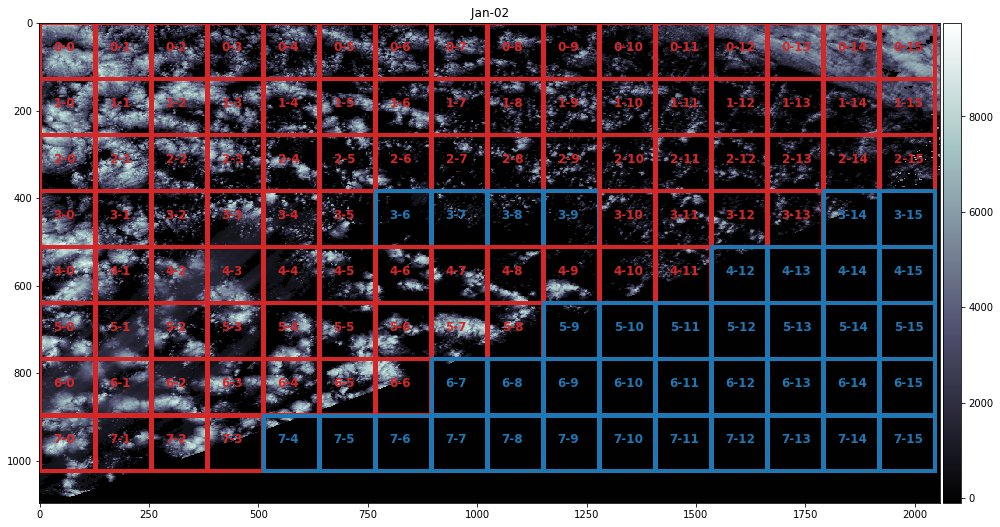

In [125]:
_color_plot_with_bounding_patch(swath_jan2, patches=patches, alpha=0.99)

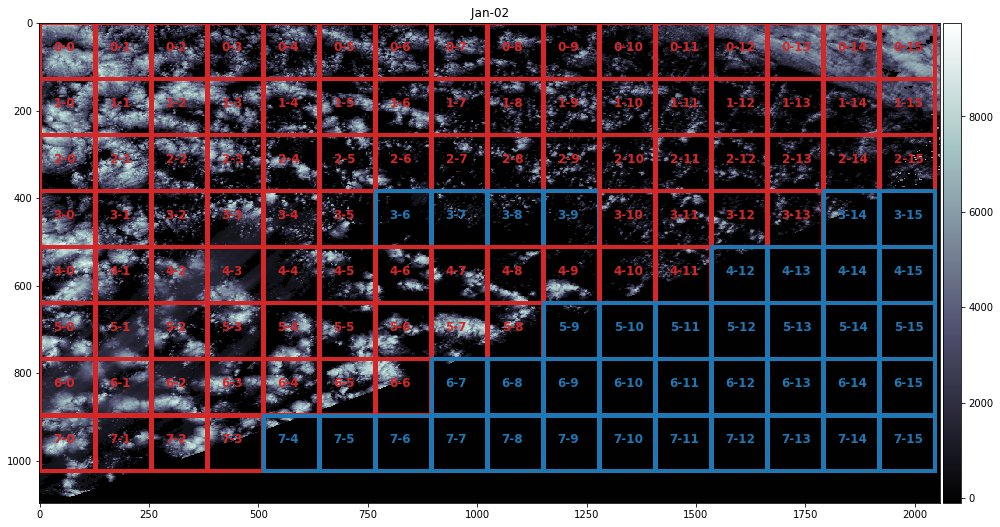

In [124]:
_color_plot_with_bounding_patch(swath_jan2, patches=patches, alpha=0.95)

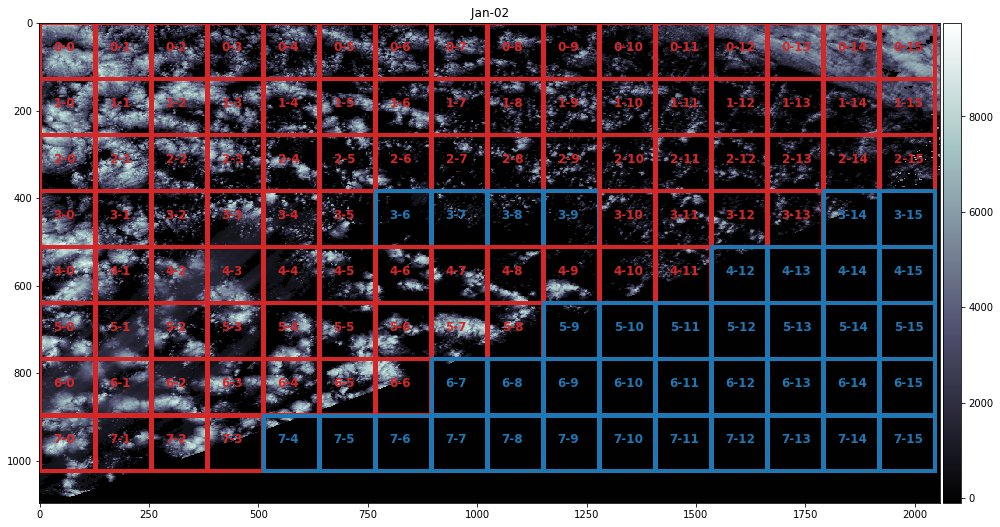

In [126]:
_color_plot_with_bounding_patch(swath_jan2, patches=patches, alpha=0.90)

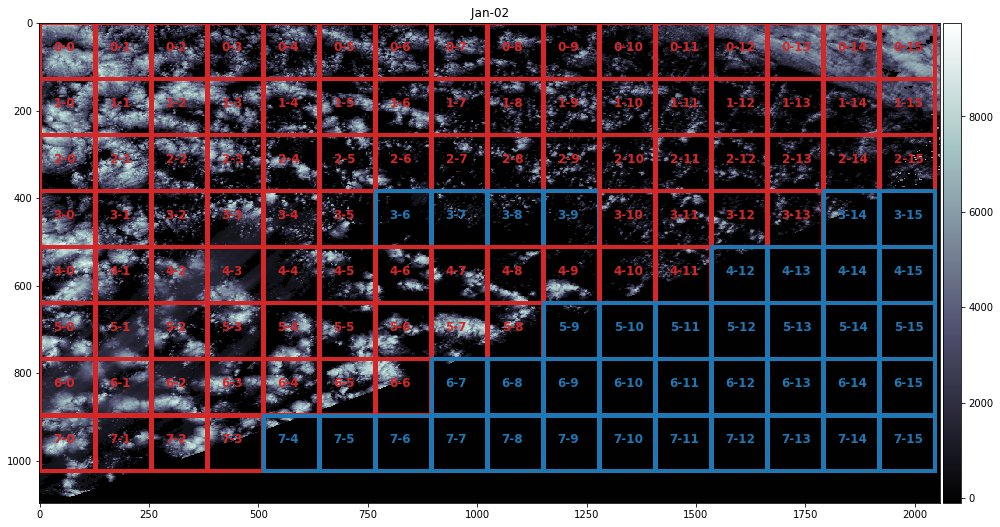

In [127]:
_color_plot_with_bounding_patch(swath_jan2, patches=patches, alpha=0.70)

## check histgram for distribution of radiance 

In [128]:
array_jan2 = np.asarray(swath_jan2)
print(array_jan2.shape)

(1097, 2058, 7)


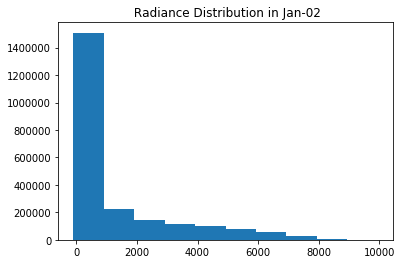

In [129]:
plt.figure()
plt.hist(array_jan2[:,:,0].flatten())
plt.title(" Radiance Distribution in Jan-02")
plt.show()

# TODO: feature add
feature modify function and value

## Find longest line by OpenCV

input image : patches_rgb band 0 to band 2 for making RGB like image

Reference URL

https://stackoverflow.com/questions/36881126/longest-line-detection-python-opencv

In [138]:
# gen RGB like image
patches_rgb = array_jan2[:,:,:3]
print(patches_rgb.shape)

(1097, 2058, 3)


In [142]:
nmax = np.max(patches_rgb[:,:,0].flatten())

In [143]:
nmax

9955

In [145]:
_patches_rgb = patches_rgb/nmax

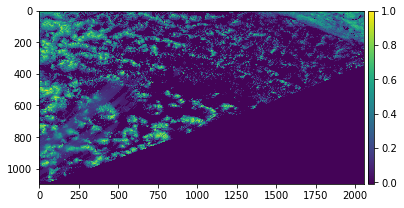

In [146]:
fig = plt.figure()
ax = plt.subplot(111)
im  = plt.imshow(_patches_rgb[:,:,0])
divider = make_axes_locatable(ax)
ax_cb = divider.new_horizontal(size="2%", pad=0.05)
fig.add_axes(ax_cb)
fig.colorbar(im, cax=ax_cb)
plt.show()

In [147]:
# change float to integer
_patches_rgb = _patches_rgb.astype(np.uint8)

In [149]:
# Filtering/Threshold value
retval, dst = cv2.threshold(_patches_rgb, 0, 255, cv2.THRESH_BINARY)

In [ ]:
# get rid of thinner lines
#kernel = np.ones()